In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import seaborn as sns
import plotly.express as px
from sklearn.metrics import mean_absolute_error

from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor, RandomForestRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn.compose import make_column_selector as selector
from sklearn.compose import ColumnTransformer, TransformedTargetRegressor
from sklearn.preprocessing import OneHotEncoder, StandardScaler, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.model_selection import KFold, RandomizedSearchCV, cross_val_predict, cross_validate, GridSearchCV, train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler, RobustScaler

import warnings
warnings.filterwarnings('ignore')

import shap
shap.initjs()


# import preprocessed dataframe 
df_normal_quality = pd.read_csv('dataframes/df_normal_quality.csv', index_col= 0).reset_index(drop = True)
y = df_normal_quality.SalePrice
X = df_normal_quality.drop(['SalePrice', 'PID'], axis =1).copy()

# universal parameters for all models 
kf = KFold(n_splits=5, shuffle=True, random_state=42)
numerical_columns_selector = selector(dtype_exclude=object)
categorical_columns_selector = selector(dtype_include=object)
numerical_columns = numerical_columns_selector(X)
categorical_columns = categorical_columns_selector(X)


# LASSO

In [3]:
categorical_preprocessor = OneHotEncoder(handle_unknown="ignore")               

numerical_preprocessor = RobustScaler()


preprocessor = ColumnTransformer(
    [
        ("robust_scaler", numerical_preprocessor, numerical_columns),
        ("one-hot-encoder", categorical_preprocessor, categorical_columns),
    ]
)



lasso_pipe = Pipeline(steps=[("Preprocess", preprocessor), 
                             ("Regressor", TransformedTargetRegressor(regressor = Lasso(alpha = 0.0003059499593517016),
                                                                func =np.log, inverse_func=np.exp))])

                         
scores = cross_val_score(lasso_pipe, X, y, cv = kf, error_score='raise')

print('Lasso')

lasso_std = scores.std()
lasso_score = scores.mean()

print('score', lasso_score)
print('standard deviation', lasso_std)
print('      ')

lasso_pipe.fit(X,y)

lasso_predictions = lasso_pipe.predict(X)
print('predicted prices', lasso_predictions)

lasso_mae = mean_absolute_error(y, lasso_predictions)
print('Mean Absolute Error:', lasso_mae)

lasso_mpv = lasso_predictions.mean()
print ('Mean Predicted Home Value', lasso_mpv)

mhv = y.mean()
print ('Mean  Home Value', mhv)
print('      ')

Lasso
score 0.9508125679921836
standard deviation 0.004995965282436691
      
predicted prices [125415.46689604 130117.07504741 115860.94910926 ... 153060.14400882
 224551.71100964 223786.68230574]
Mean Absolute Error: 10279.818581988946
Mean Predicted Home Value 172915.24056661013
Mean  Home Value 173427.01285897984
      


# SHAP

In [4]:
lasso_pipe.fit(X,y)

explainer_lasso_log = shap.LinearExplainer(lasso_pipe.named_steps['Regressor'].regressor_,
                          masker = lasso_pipe.named_steps['Preprocess'].transform(X))

# Calculate SHAP values for the transformed test set
shap_values_lass_log = explainer_lasso_log(lasso_pipe.named_steps['Preprocess'].transform(X))

# Get feature names after transformation
transformed_feature_names = lasso_pipe.named_steps['Preprocess'].get_feature_names_out()

# Convert SHAP values and transformed data to DataFrame for easier manipulation
# transform Explanation type into a df with named columns 
shap_values_df_lasso_log = pd.DataFrame(shap_values_lass_log.values, columns=transformed_feature_names)

categorical_prefixes = categorical_columns_selector(X)
categorical_prefixes = ["one-hot-encoder__" + word for word in categorical_prefixes]
categorical_prefixes

for prefix in categorical_prefixes:
    # Get columns that start with the prefix
    columns = [col for col in transformed_feature_names if col.startswith(prefix)]
    
    # Calculate mean SHAP value for these columns
    shap_values_df_lasso_log[prefix] = shap_values_df_lasso_log[columns].sum(axis=1)
    
    # Drop the individual encoded columns
    shap_values_df_lasso_log.drop(columns=columns, inplace=True)

# Get rid of prefixes
shap_values_df_lasso_log.columns = shap_values_df_lasso_log.columns.str.replace('robust_scaler__', 
                                                                    '', 
                                                                    regex=False)
shap_values_df_lasso_log.columns = shap_values_df_lasso_log.columns.str.replace('one-hot-encoder__', 
                                                                    '', 
                                                                    regex=False)

# reorder X columns so the original values are in the same order as the shap df
X_new_order = list(numerical_columns) + list(categorical_columns)
X_new_order =X[X_new_order]

observations = range(shap_values_df_lasso_log.shape[0])
dollar_shap_df_lasso = pd.DataFrame(columns=X_new_order.columns)
order = X_new_order.columns

for observation in observations:
    shap_values = shap_values_df_lasso_log.iloc[observation].reindex(shap_values_df_lasso_log.iloc[observation].abs().sort_values().index)
    features = shap_values.index.tolist()
    values = shap_values.values.tolist()
    bv = shap_values_lass_log.base_values[1]
    SHAPs = values
    changes = []
    
    for shaps in SHAPs:
        changes.append((np.exp(bv + shaps) - np.exp(bv)))
        bv = bv + shaps 
        
    df_change = pd.DataFrame({'Feature': features, 'Change': changes})
    df_change = df_change.set_index('Feature').T
    df_ordered_changes = df_change[order]
    dollar_shap_df_lasso.loc[observation] = df_ordered_changes.iloc[0]

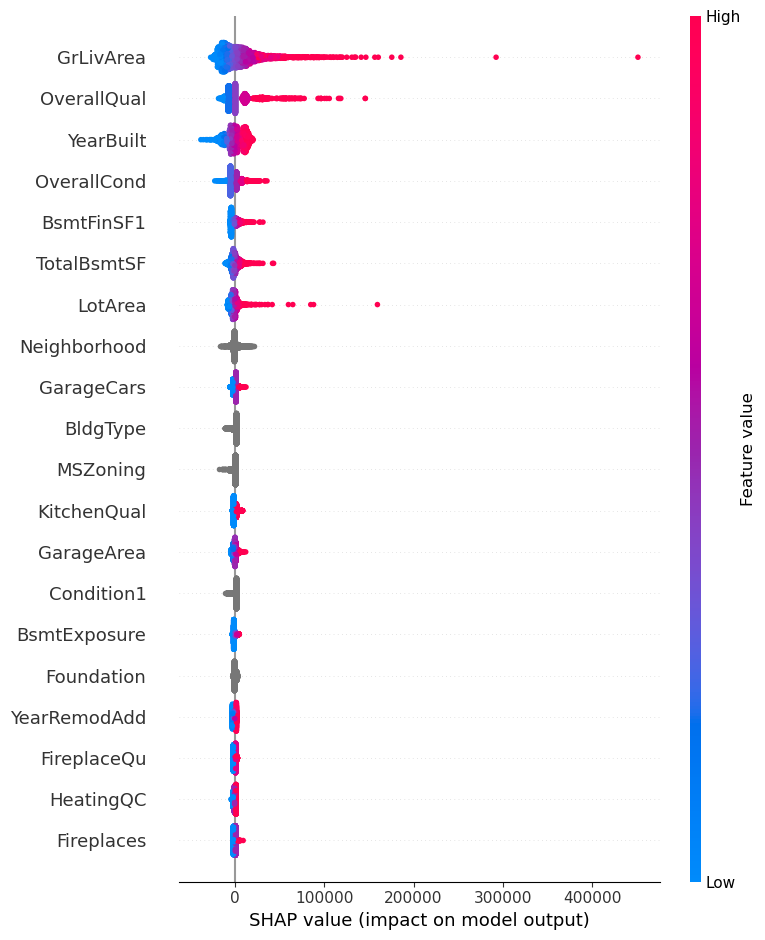

In [5]:
# Create a shap.Explanation with scaled shap values and correct feature names 
exp_lasso = shap.Explanation(dollar_shap_df_lasso.values, 
                       np.exp(shap_values_lass_log.base_values),
                       X_new_order)

shap.summary_plot(exp_lasso)

# XGB

In [6]:
categorical_preprocessor_OHE = OneHotEncoder(handle_unknown="ignore", drop = None)
categorical_preprocessor_O =  OrdinalEncoder(handle_unknown="use_encoded_value", 
                                           unknown_value= -1)
numerical_preprocessor = StandardScaler()

preprocessor_OHE = ColumnTransformer(
    [
        ("standard_scaler", numerical_preprocessor, numerical_columns),
        ("encoder", categorical_preprocessor_OHE, categorical_columns),
    ]
)

preprocessor_O = ColumnTransformer(
    [
        ("standard_scaler", numerical_preprocessor, numerical_columns),
        ("encoder", categorical_preprocessor_O, categorical_columns),
    ]
)


xgb_OHE =  XGBRegressor(max_depth= 3,
                    learning_rate= 0.04089478271640344,
                    subsample= 0.4614417149387252,
                    colsample_bytree= 0.6589253772701361,
                    n_estimators= 902,
                    min_child_weight= 2)


xgb_O = XGBRegressor(max_depth= 4,
                    learning_rate= 0.044081018318051106,
                    subsample= 0.5797329944770706,
                    colsample_bytree= 0.5330333973787846,
                    n_estimators= 917,
                    min_child_weight= 2)



xgb_pipe_OHE = Pipeline(steps=[("Preprocess", preprocessor_OHE), 
                               ("Regressor", TransformedTargetRegressor(regressor =xgb_OHE,
                                                                          func =np.log, inverse_func=np.exp))])
                          

xgb_pipe_O = Pipeline(steps=[("Preprocess", preprocessor_O), ("XGB", xgb_O)])


scores_OHE = cross_val_score(xgb_pipe_OHE, X, y, cv = kf, error_score='raise')


scores_O = cross_val_score(xgb_pipe_O, X, y, cv = kf, error_score='raise')


print('XGB OneHot')
xgb_score = scores_OHE.mean()
xgb_std = scores_OHE.std()
print('score', xgb_score)
print('standard deviation', xgb_std)

xgb_pipe_OHE.fit(X,y)

xgb_OHE_predictions = xgb_pipe_OHE.predict(X)
print('predicted prices', xgb_OHE_predictions)

xgb_OHE_mae = mean_absolute_error(y, xgb_OHE_predictions)
print('Mean Absolute Error:', xgb_OHE_mae)

xgb_OHE_mpv = xgb_OHE_predictions.mean()
print ('Mean Predicted Home Value', xgb_OHE_mpv)

mhv = y.mean()
print ('Mean  Home Value', mhv)

print('         ')
print('XGB Ordinal')
print('score', scores_O.mean())
print('standard deviation', scores_O.std())

xgb_pipe_O.fit(X,y)

xgb_O_predictions = xgb_pipe_O.predict(X)
print('predicted prices', xgb_O_predictions)

xgb_O_mae = mean_absolute_error(y, xgb_O_predictions)
print('Mean Absolute Error:', xgb_O_mae)

xgb_O_mpv = xgb_O_predictions.mean()
print ('Mean Predicted Home Value', xgb_O_mpv)

mhv = y.mean()
print ('Mean  Home Value', mhv)

XGB OneHot
score 0.9545422235903054
standard deviation 0.0025644277358230962
predicted prices [124615.625 134415.23  117523.625 ... 144307.75  221956.55  222302.28 ]
Mean Absolute Error: 6433.311073456923
Mean Predicted Home Value 173030.1
Mean  Home Value 173427.01285897984
         
XGB Ordinal
score 0.9520954039217431
standard deviation 0.00400626352265317
predicted prices [123697.734 137102.42  121085.1   ... 145562.38  224346.8   214692.53 ]
Mean Absolute Error: 3958.2779866989927
Mean Predicted Home Value 173431.39
Mean  Home Value 173427.01285897984


# XGB SHAP
# One hot encoded

In [7]:
xgb_pipe_OHE.fit(X,y)
# This is the same code as Lasso one hot combined but for xgb one hot 
explainer_xgb = shap.Explainer(xgb_pipe_OHE.named_steps['Regressor'].regressor_,
                          masker = xgb_pipe_OHE.named_steps['Preprocess'].transform(X))

# Calculate SHAP values for the transformed test set
shap_values_xgb = explainer_xgb(xgb_pipe_OHE.named_steps['Preprocess'].transform(X))

# Get feature names after transformation
transformed_feature_names = xgb_pipe_OHE.named_steps['Preprocess'].get_feature_names_out()

# Convert SHAP values and transformed data to DataFrame for easier manipulation
# transform Explanation type into a df with named columns 
shap_values_df_xgb_log = pd.DataFrame(shap_values_xgb.values, 
                                      columns=transformed_feature_names)
    
categorical_prefixes = categorical_columns_selector(X)
categorical_prefixes = ["encoder__" + word for word in categorical_prefixes]

for prefix in categorical_prefixes:
    # Get columns that start with the prefix
    columns = [col for col in transformed_feature_names if col.startswith(prefix)]
    
    # Calculate mean SHAP value for these columns
    shap_values_df_xgb_log[prefix] = shap_values_df_xgb_log[columns].sum(axis=1)
    
    # Drop the individual encoded columns
    shap_values_df_xgb_log.drop(columns=columns, inplace=True)
# Get rid of prefixes
shap_values_df_xgb_log.columns = shap_values_df_xgb_log.columns.str.replace('standard_scaler__', 
                                                                    '', 
                                                                    regex=False)
shap_values_df_xgb_log.columns = shap_values_df_xgb_log.columns.str.replace('encoder__', 
                                                                    '', 
                                                                    regex=False)

observations = range(shap_values_df_xgb_log.shape[0])
dollar_shap_df_xgb = pd.DataFrame(columns=X_new_order.columns)
order = X_new_order.columns

for observation in observations:
    shap_values = shap_values_df_xgb_log.iloc[observation].reindex(shap_values_df_xgb_log.iloc[observation].abs().sort_values().index)
    features = shap_values.index.tolist()
    values = shap_values.values.tolist()
    bv = shap_values_xgb.base_values[1]
    SHAPs = values
    changes = []
    
    for shaps in SHAPs:
        changes.append((np.exp(bv + shaps) - np.exp(bv)))
        bv = bv + shaps 
        
    df_change = pd.DataFrame({'Feature': features, 'Change': changes})
    df_change = df_change.set_index('Feature').T
    df_ordered_changes = df_change[order]
    dollar_shap_df_xgb.loc[observation] = df_ordered_changes.iloc[0]



 99%|===================| 2300/2333 [01:05<00:00]        

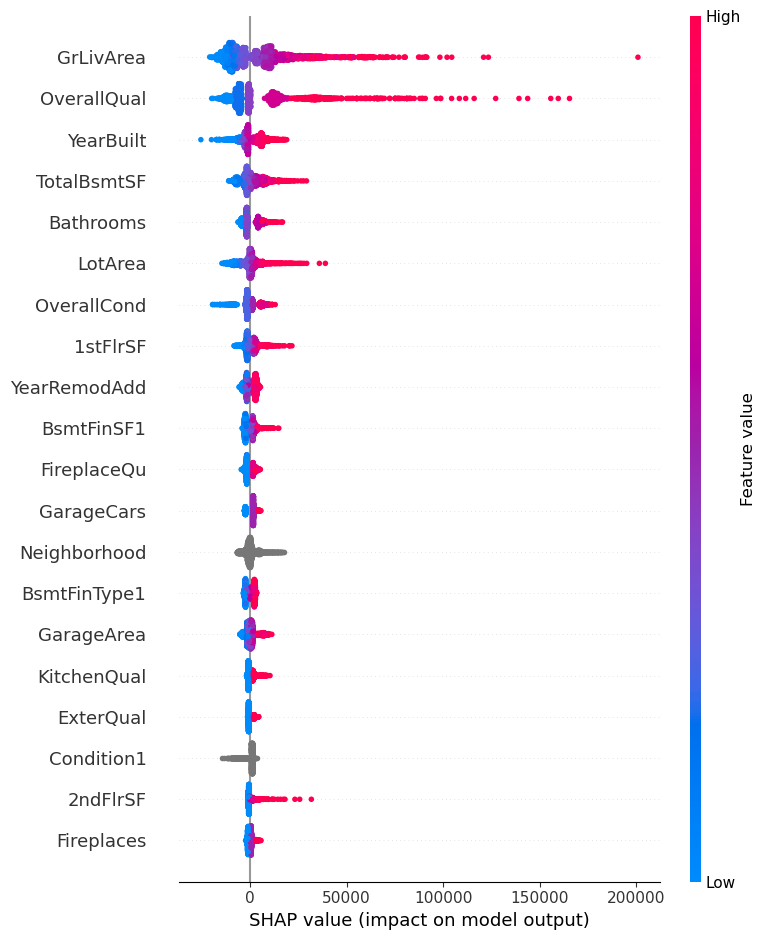

In [8]:
exp_xgb_OHE = shap.Explanation(dollar_shap_df_xgb.values, 
                       np.exp(shap_values_xgb.base_values),
                       X_new_order)

shap.summary_plot(exp_xgb_OHE, max_display= 20)

# XGB SHAP 
## Ordinal encoded

 99%|===================| 2309/2333 [01:42<00:01]        

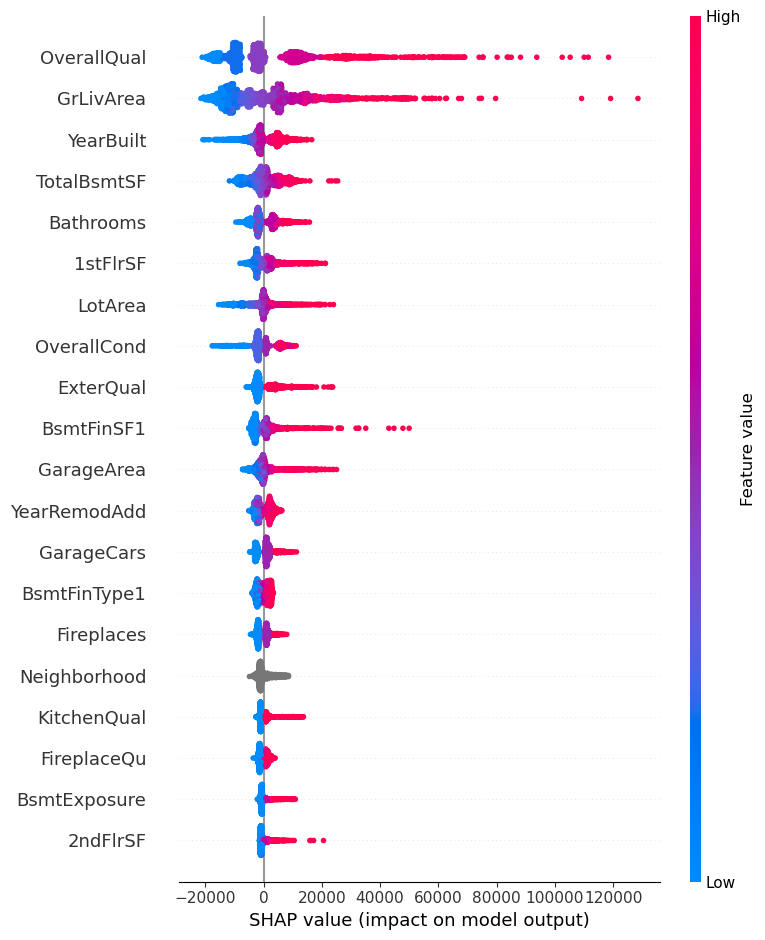

In [9]:
xgb_pipe_O.fit(X,y)

explainer_xgb_o = shap.Explainer(xgb_pipe_O.named_steps['XGB'],
                          masker = xgb_pipe_O.named_steps['Preprocess'].transform(X))

# Calculate SHAP values for the transformed test set
shap_values_xgb_o = explainer_xgb_o(xgb_pipe_O.named_steps['Preprocess'].transform(X))

# Get feature names after transformation
transformed_feature_names = xgb_pipe_O.named_steps['Preprocess'].get_feature_names_out()

# Convert SHAP values and transformed data to DataFrame for easier manipulation
# transform Explanation type into a df with named columns 
shap_values_df_xgb_o = pd.DataFrame(shap_values_xgb_o.values, columns=transformed_feature_names)

shap_values_df_xgb_o.columns = shap_values_df_xgb_o.columns.str.replace('standard_scaler__', 
                                                                    '', 
                                                                    regex=False)
shap_values_df_xgb_o.columns = shap_values_df_xgb_o.columns.str.replace('encoder__', 
                                                                    '', 
                                                                    regex=False)

exp_xgb_O = shap.Explanation(shap_values_df_xgb_o.values, 
                           shap_values_xgb_o.base_values, 
                           X_new_order
                         )

shap.summary_plot(exp_xgb_O, max_display= 20)

# Comparing Lasso and XGB

In [10]:
df_predictions = df_normal_quality.copy()
df_predictions['Lasso'] = lasso_predictions
df_predictions['error_Lasso'] = df_predictions.SalePrice - df_predictions.Lasso
df_predictions['xgb'] = xgb_OHE_predictions
df_predictions['error_xgb'] = df_predictions.SalePrice - df_predictions.xgb
df_predictions[['SalePrice', 'Lasso',  'error_Lasso', 'xgb','error_xgb']]

,SalePrice,Lasso,error_Lasso,xgb,error_xgb
0,126000,125415.466896,584.533104,124615.625000,1384.375000
1,139500,130117.075047,9382.924953,134415.234375,5084.765625
2,124900,115860.949109,9039.050891,117523.625000,7376.375000
3,114000,105119.599868,8880.400132,110074.781250,3925.218750
4,227000,223692.819190,3307.180810,212588.906250,14411.093750
...,...,...,...,...,...
2328,121000,107054.707286,13945.292714,115790.000000,5210.000000
2329,139600,122905.260713,16694.739287,135799.328125,3800.671875
2330,145000,153060.144009,-8060.144009,144307.750000,692.250000
2331,217500,224551.711010,-7051.711010,221956.546875,-4456.546875


In [11]:
data = pd.DataFrame({
    'GrLivArea': X['GrLivArea'],
    'OverallQual': X['OverallQual'],
    'Error': y - lasso_predictions
})

# Create the plot
fig = px.scatter(
    data, x='GrLivArea', y='Error',
    color=np.sqrt(X.OverallQual), 
    title=f'Lasso: Living Area vs. Prediction Error<br><sup>R2:{lasso_score:.4f} / std: {lasso_std:.4f} / Mean Absolute Error: ${lasso_mae:.2f}</sup>',
    labels={'GrLivArea': 'Above Ground Living Area (Square Feet)', 
            'Error': 'Error ($)',
            'color': ''}
)

# Add a horizontal line at y=0
fig.add_shape(type="line",
              x0=min(data['GrLivArea']), x1=max(data['GrLivArea']),
              y0=0, y1=0,
              line=dict(color="red", dash="dash"))


fig.update_layout(
    yaxis_range=[-100000, 100000],
    yaxis_title_standoff=0,
    height = 700, 
    width = 700
)

fig.add_annotation(
    x=1.1,  # Adjust the x position as needed
    y=1.1,  # Adjust the y position as needed
    text="Overall<br>Quality",  # Custom legend title with line break
    showarrow=False,
    xref="paper",
    yref="paper",
    align="left",
    font=dict(size=13)
)
# Show plot
fig.show()

fig.write_image("images/lasso_error.png")

In [12]:
data = pd.DataFrame({
    'GrLivArea': X['GrLivArea'],
    'OverallQual': X['OverallQual'],
    'Error': y - xgb_OHE_predictions
})

# Create the plot
fig = px.scatter(
    data, x='GrLivArea', y='Error',
    color=np.sqrt(X.OverallQual), 
    title=f'XGB: Living Area vs. Prediction Error<br><sup>R2: {xgb_score:.4f} / std: {xgb_std:.4f} / Mean Absolute Error: ${xgb_OHE_mae:.2f}</sup>',
    labels={'GrLivArea': 'Above Ground Living Area (Square Feet)', 
            'Error': 'Error ($)', 
            'color': ''}
)

# Add a horizontal line at y=0
fig.add_shape(type="line",
              x0=min(data['GrLivArea']), x1=max(data['GrLivArea']),
              y0=0, y1=0,
              line=dict(color="red", dash="dash"))

fig.update_layout(
    yaxis_range=[-100000, 100000],
    yaxis_title_standoff=0,
    height = 700, 
    width = 700
)

fig.add_annotation(
    x=1.1,  # Adjust the x position as needed
    y=1.1,  # Adjust the y position as needed
    text="Overall<br>Quality",  # Custom legend title with line break
    showarrow=False,
    xref="paper",
    yref="paper",
    align="left",
    font=dict(size=13)
)

# Show plot
fig.show()

fig.write_image("images/xgb_error.png")

# Neighborhood

In [39]:
# Sort the data by shap_values_df_lasso_comb.Neighborhood
sorted_indices = dollar_shap_df_lasso.Neighborhood.argsort()
sorted_neighborhoods = X.Neighborhood[sorted_indices]
sorted_shap_values_lasso = dollar_shap_df_lasso.Neighborhood[sorted_indices]
sorted_shap_values_xgb = dollar_shap_df_xgb.Neighborhood[sorted_indices]

# Create traces
trace1 = go.Scatter(
    x=sorted_neighborhoods,
    y=sorted_shap_values_xgb,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x=sorted_neighborhoods,
    y=sorted_shap_values_lasso,
    mode='markers',
    name='Lasso',
    opacity= .6
)

# Create the layout
layout = go.Layout(
    title='Neighborhood SHAP Values',
    xaxis=dict(title='Neighborhood'),
    yaxis=dict(title='SHAP Values ($)'),
        legend=dict(
        orientation="v",  # Horizontal orientation
        yanchor="bottom",
        y=1,  # Adjust the y position to be next to the title
        xanchor="center",
        x=.9  # Center horizontally
    )
)


fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.85),
    height = 400,
    width = 800)

fig.show()

fig.write_image("images/neighborhood.png")


In [76]:
# Sort the data by shap_values_df_lasso_comb.Neighborhood
sorted_indices = dollar_shap_df_lasso.Neighborhood.argsort()
sorted_neighborhoods = X.Neighborhood[sorted_indices]
sorted_shap_values_lasso = shap_values_df_lasso_log.Neighborhood[sorted_indices]
sorted_shap_values_xgb = shap_values_df_xgb_log.Neighborhood[sorted_indices]


# Create traces
trace1 = go.Scatter(
    x=sorted_neighborhoods,
    y=sorted_shap_values_xgb,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x=sorted_neighborhoods,
    y=sorted_shap_values_lasso,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Neighborhood SHAP Values',
    xaxis=dict(title='Neighborhood'),
    yaxis=dict(title='SHAP Values (log scale)'),
    legend=dict(
        orientation="v",  # Horizontal orientation
        yanchor="bottom",
        y=1,  # Adjust the y position to be next to the title
        xanchor="center",
        x=.9  # Center horizontally
    )
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.85),
    height = 400,
    width = 800)

fig.show()
fig.write_image("images/neighborhood_log.png")



In [45]:
sorted_indices = dollar_shap_df_xgb.Neighborhood.argsort()
sorted_neighborhoods = X.Neighborhood[sorted_indices]
sorted_shap_values_lasso = dollar_shap_df_lasso.Neighborhood[sorted_indices]
sorted_shap_values_xgb = dollar_shap_df_xgb.Neighborhood[sorted_indices]
sorted_quality = X.OverallQual[sorted_indices]

fig = px.scatter(
    x=sorted_neighborhoods, 
    y=sorted_shap_values_xgb, 
    color = np.sqrt(sorted_quality),
    labels={'x': 'Neighborhood', 'y': 'Neighborhood SHAP Values ($)',
           'color' : "Overall <br>Quality"},
    title='Neighborhood SHAP Values (XGBoost)'
)
fig.update_layout(
    title=dict(y=0.9))
# Show the plot
fig.show()
fig.write_image("images/neighborhood_xgb.png")


In [58]:
(df_predictions.groupby('Neighborhood').error_Lasso.mean()).abs() - (df_predictions.groupby('Neighborhood').error_xgb.mean()).abs()

Neighborhood
Blmngtn      848.863568
Blueste      -57.124247
BrDale      1891.830510
BrkSide     2277.278592
ClearCr     2293.746392
CollgCr      391.054505
Crawfor      973.256498
Edwards       15.599229
Gilbert      222.896905
Greens      9044.584543
GrnHill    39917.392232
IDOTRR       510.359719
Landmrk      388.002073
MeadowV      354.324834
Mitchel      450.443402
NAmes        296.520943
NPkVill    -1324.188784
NWAmes      1943.102718
NoRidge      439.894372
NridgHt     1065.351137
OldTown      564.544607
SWISU       1896.129475
Sawyer       213.226856
SawyerW      923.996833
Somerst      790.765109
StoneBr     5730.780029
Timber      2003.955240
Veenker    -2082.839905
dtype: float64

In [46]:
Crawford_SWISU = pd.DataFrame(df_predictions.loc[df_predictions.Neighborhood == 'Crawfor'].describe() - df_predictions.loc[df_predictions.Neighborhood == 'SWISU'].describe()) 

In [49]:
Crawford_SWISU.iloc[1].head(20)

PID             964091.199298
GrLivArea          106.541053
SalePrice        59747.819649
MSSubClass         -10.528070
LotFrontage         18.840101
LotArea           3745.065263
Alley               -0.091579
LotShape             0.481053
LandContour         -0.298947
Utilities            0.000000
LandSlope           -0.107368
OverallQual          8.457193
OverallCond          0.557193
YearBuilt           10.395439
YearRemodAdd        10.754035
MasVnrArea          58.074035
ExterQual            8.245965
ExterCond            0.172982
BsmtQual             0.332982
BsmtCond             0.117544
Name: mean, dtype: float64

In [62]:
color = X.Neighborhood

color_transformed = []
for word in color:
    if word == 'Crawfor':
        color_transformed.append('Crawfor')
    elif word == 'BrkSide':
        color_transformed.append('BrkSide')
    elif word == 'ClearCr':
        color_transformed.append('ClearCr')
    else:
        color_transformed.append('other')
    
fig = px.scatter(
    x=np.sqrt(X.OverallQual), 
    y=dollar_shap_df_xgb.Neighborhood, 
    color = color_transformed,
    labels={'x': 'Overall Quality', 'y': 'Neighborhood SHAP Values ($)', 'color' : 'Neighborhood'},
    title='Overall Quality vs Neighborhood SHAP Values (XGBoost)'
) 
fig.update_layout(
    title=dict(y=0.85))
# Show the plot
fig.show()
fig.write_image("images/neighborhood_xgb_specific.png")


# Living Area

In [74]:
trace1 = go.Scatter(
    x= X.GrLivArea,
    y=shap_values_df_xgb_log.GrLivArea,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.GrLivArea,
    y= shap_values_df_lasso_log.GrLivArea,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Living Area SHAP Values',
    xaxis=dict(title='Above Ground Living Area (square feet)'),
    yaxis=dict(title='SHAP Values (log scale)'),
    legend=dict(
        x=0.02,
        y=0.98,
        bgcolor='rgba(255, 255, 255, 0.5)'
    )
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.9),
    height = 700,
    width = 700)
    
fig.show()
fig.write_image("images/living_area_SHAP_log.png")


In [75]:
trace1 = go.Scatter(
    x= X.GrLivArea,
    y=dollar_shap_df_xgb.GrLivArea,
    mode='markers',
    name='XGB',
    opacity= 1
)
trace2 = go.Scatter(
    x= X.GrLivArea,
    y= dollar_shap_df_lasso.GrLivArea,
    mode='markers',
    name='Lasso',
    opacity= .6
)

# Create the layout
layout = go.Layout(
    title='Living Area SHAP Values',
    xaxis=dict(title='Above Ground Living Area (square feet)'),
    yaxis=dict(title='SHAP Value ($)'),
    legend=dict(
        x=0.02,
        y=0.98,
        bgcolor='rgba(255, 255, 255, 0.5)'
    )
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.9),
    height = 700,
    width = 700)

fig.show()
fig.write_image("images/living_area_SHAP.png")


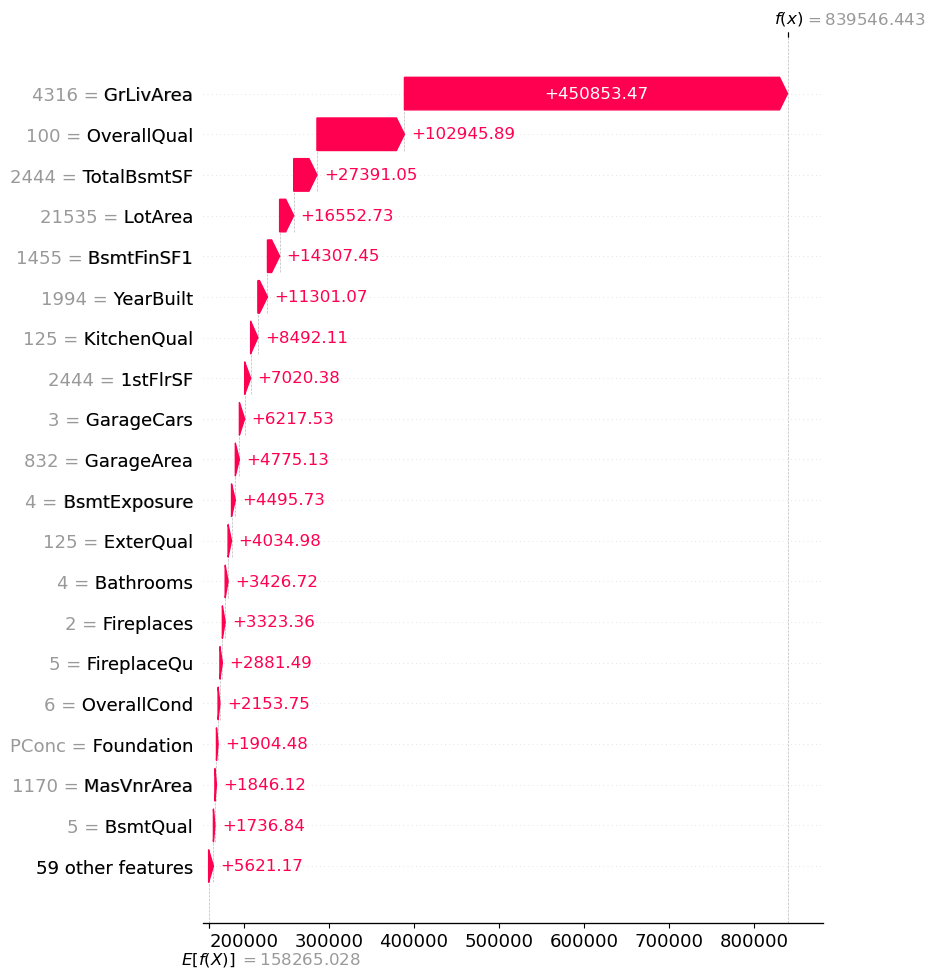

In [68]:
shap.waterfall_plot(exp_lasso[807], max_display= 20)

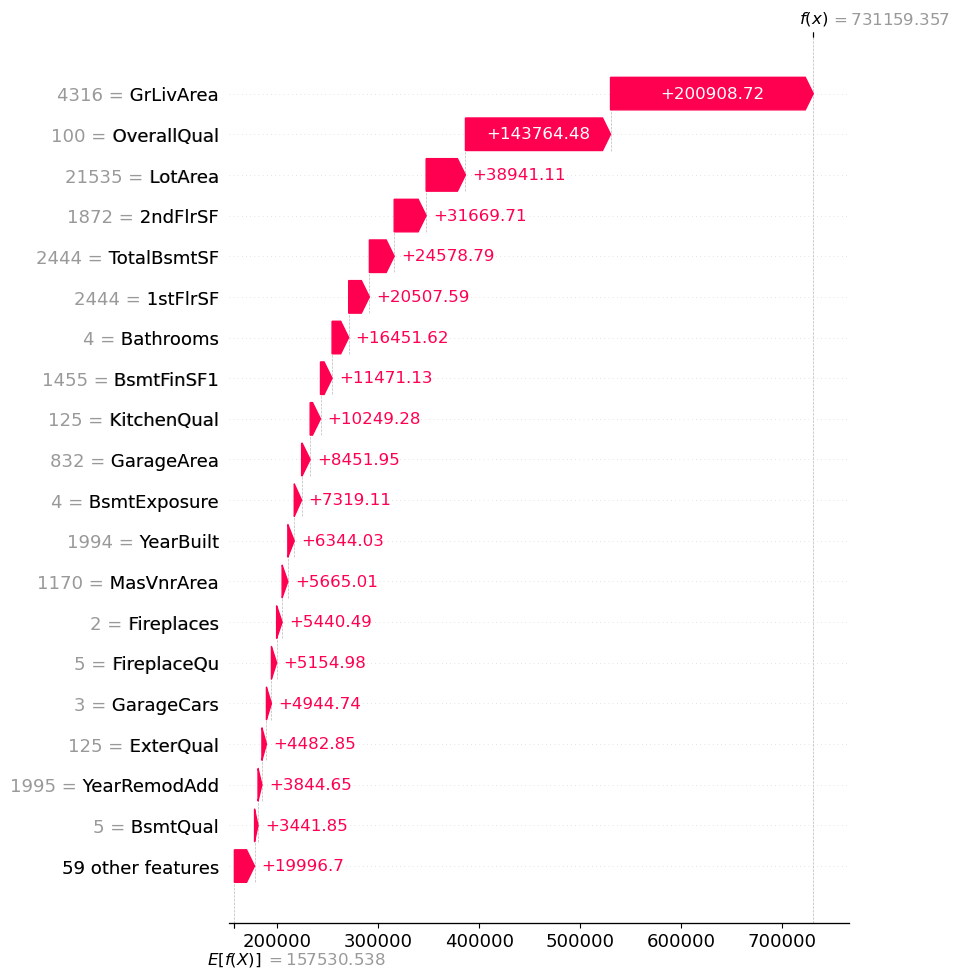

In [69]:
shap.waterfall_plot(exp_xgb_OHE[807], max_display= 20)

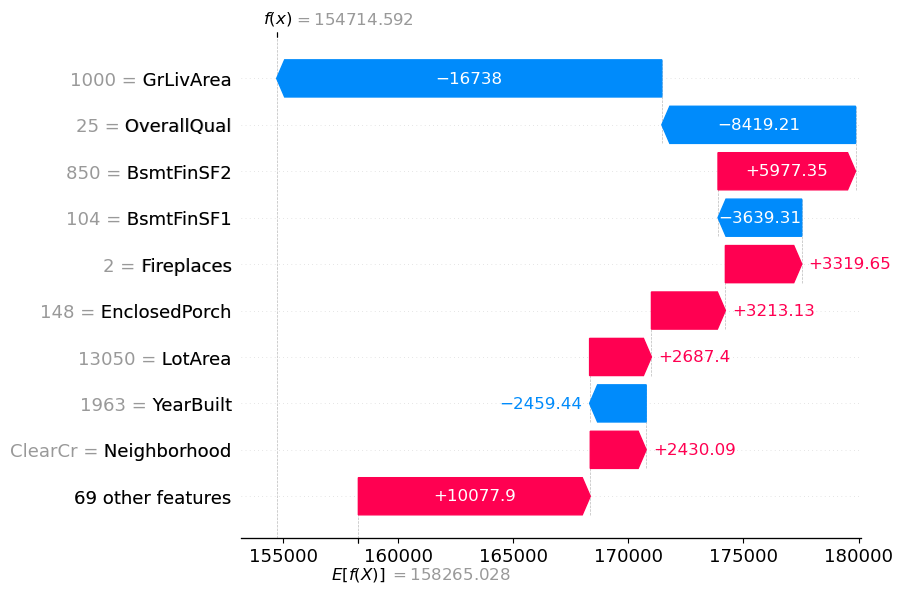

In [70]:
shap.waterfall_plot(exp_lasso[145])

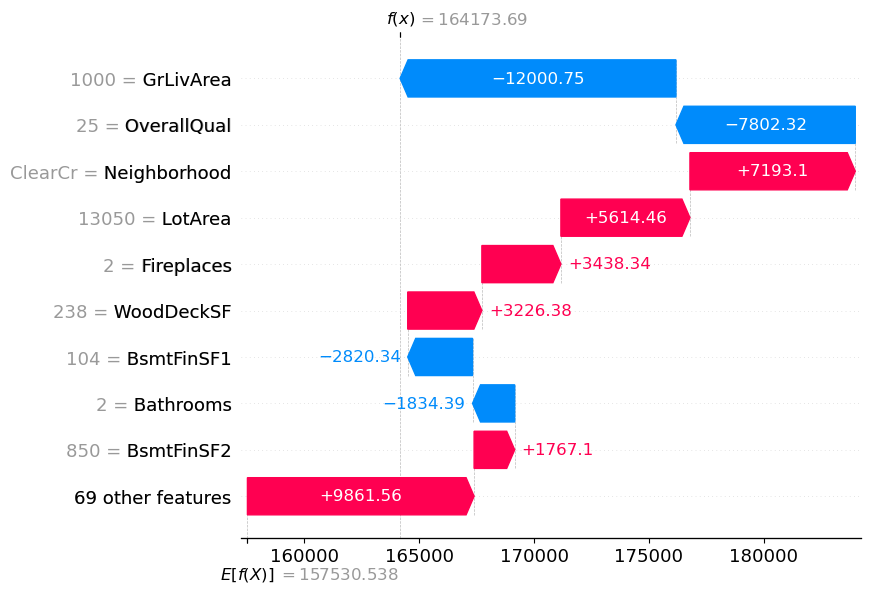

In [71]:
shap.waterfall_plot(exp_xgb_OHE[145])

# Overall Quality

In [80]:
trace1 = go.Scatter(
    x= np.sqrt(X.OverallQual),
    y=shap_values_df_xgb_log.OverallQual,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= np.sqrt(X.OverallQual),
    y= shap_values_df_lasso_log.OverallQual,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Overall Quality SHAP Values',
    xaxis=dict(title='Overall Quality'),
    yaxis=dict(title='SHAP Values (log scale)'),
       legend=dict(
        x=0.02,
        y=0.98,
        bgcolor='rgba(255, 255, 255, 0.5)'
    )
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.9),
    height = 700,
    width = 700)

fig.show()
fig.write_image("images/overall_qual_SHAP_log.png")


In [81]:
trace1 = go.Scatter(
    x= np.sqrt(X.OverallQual),
    y=dollar_shap_df_xgb.OverallQual,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= np.sqrt(X.OverallQual),
    y= dollar_shap_df_lasso.OverallQual,
    mode='markers',
    name='Lasso',
    opacity= .6
)

# Create the layout
layout = go.Layout(
    title='Overall Quality SHAP Values',
    xaxis=dict(title='Overall Quality'),
    yaxis=dict(title='SHAP Values ($)'),
       legend=dict(
        x=0.02,
        y=0.98,
        bgcolor='rgba(255, 255, 255, 0.5)'
    )
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.9),
    height = 700,
    width = 700)

fig.show()
fig.write_image("images/overall_qual_SHAP.png")


# Year Built

In [83]:
trace1 = go.Scatter(
    x=X.YearBuilt,
    y=dollar_shap_df_xgb.YearBuilt,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.YearBuilt,
    y= dollar_shap_df_lasso.YearBuilt,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Year Built SHAP Values',
    xaxis=dict(title='Year Built'),
    yaxis=dict(title='SHAP Values ($)'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.85))

fig.show()
fig.write_image("images/Lot_area_SHAP_log.png")


# Lot Area 

In [91]:
trace1 = go.Scatter(
    x=X.LotArea,
    y=shap_values_df_xgb_log.LotArea,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.LotArea,
    y= shap_values_df_lasso_log.LotArea,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Lot Area SHAP Values',
    xaxis=dict(title='Lot Area (square feet)'),
    yaxis=dict(title='SHAP Values (log scale)'),
    legend=dict(
        orientation="v",  # Horizontal orientation
        yanchor="bottom",
        y=1,  # Adjust the y position to be next to the title
        xanchor="center",
        x=.9  # Center horizontally
    )
)

fig = go.Figure(data=[trace1, trace2], layout=layout)


fig.update_layout(
    title=dict(y=0.85),
    height = 400,
    width = 600)

fig.show()
fig.write_image("images/Lot_area_SHAP_log.png")


In [92]:
trace1 = go.Scatter(
    x=X.LotArea,
    y=dollar_shap_df_xgb.LotArea,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.LotArea,
    y= dollar_shap_df_lasso.LotArea,
    mode='markers',
    name='Lasso',
    opacity= .6
)

# Create the layout
layout = go.Layout(
    title='Lot Area SHAP Values',
    xaxis=dict(title='Lot Area (square feet)'),
    yaxis=dict(title='SHAP Values ($)'),
     legend=dict(
        orientation="v",  # Horizontal orientation
        yanchor="bottom",
        y=1,  # Adjust the y position to be next to the title
        xanchor="center",
        x=.9  # Center horizontally
    )
)


fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.85),
    height = 400,
    width = 600)

fig.show()
fig.write_image("images/Lot_area_SHAP.png")


# Garage Cars

In [94]:

trace1 = go.Scatter(
    x=X.GarageCars,
    y=shap_values_df_xgb_log.GarageCars,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.GarageCars,
    y= shap_values_df_lasso_log.GarageCars,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Garage Cars SHAP Values',
    xaxis=dict(title='Cars'),
    yaxis=dict(title='SHAP Values (log scale)'),    
    legend=dict(
        orientation="v",  # Horizontal orientation
        yanchor="bottom",
        y=1,  # Adjust the y position to be next to the title
        xanchor="center",
        x=.9  # Center horizontally
    )
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.85),
    height = 400,
    width = 600)

fig.show()
fig.write_image("images/garage_cars_SHAP_log.png")


In [96]:

trace1 = go.Scatter(
    x=X.GarageCars,
    y=dollar_shap_df_xgb.GarageCars,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.GarageCars,
    y= dollar_shap_df_lasso.GarageCars,
    mode='markers',
    name='Lasso',
    opacity= .6
)

# Create the layout
layout = go.Layout(
    title='Garage Cars SHAP Values',
    xaxis=dict(title='Cars'),
    yaxis=dict(title='SHAP Values ($)'),
    legend=dict(
        orientation="v",  # Horizontal orientation
        yanchor="bottom",
        y=1,  # Adjust the y position to be next to the title
        xanchor="center",
        x=.9  # Center horizontally
    )
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.85),
    height = 400,
    width = 600)

fig.show()
fig.write_image("images/garage_cars_SHAP.png")


# Garage Size

In [98]:

trace1 = go.Scatter(
    x=X.GarageArea,
    y=dollar_shap_df_xgb.GarageArea,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.GarageArea,
    y= dollar_shap_df_lasso.GarageArea,
    mode='markers',
    name='Lasso',
    opacity= .6
)

# Create the layout
layout = go.Layout(
    title='Garage Area SHAP Values',
    xaxis=dict(title='Garage Area (Square Feet)'),
    yaxis=dict(title='SHAP Values ($)'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.update_layout(
    title=dict(y=0.9),
    height = 700,
    width = 700)

fig.show()
fig.write_image("images/garage_cars_SHAP.png")


# Bathrooms

In [102]:
trace1 = go.Scatter(
    x=X.Bathrooms,
    y=dollar_shap_df_xgb.Bathrooms,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.Bathrooms,
    y= dollar_shap_df_lasso.Bathrooms,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Bathrooms SHAP Values',
    xaxis=dict(title='Bathrooms'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.show()

#  Basement Size

In [103]:
trace1 = go.Scatter(
    x=X.TotalBsmtSF,
    y=dollar_shap_df_xgb.TotalBsmtSF,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.TotalBsmtSF,
    y= dollar_shap_df_lasso.TotalBsmtSF,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Basement SHAP Values',
    xaxis=dict(title='Basement Size (Square Feet)'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.show()

# Bedrooms

In [126]:
trace1 = go.Scatter(
    x=X.BedroomAbvGr,
    y=dollar_shap_df_xgb.BedroomAbvGr,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.BedroomAbvGr,
    y= dollar_shap_df_lasso.BedroomAbvGr,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Bedrooms SHAP Values ($)',
    xaxis=dict(title='Bedrooms'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.show()

In [127]:
df_predictions.loc[df_predictions.BedroomAbvGr > 3].GrLivArea.mean()

2023.5750708215298

In [114]:
df_predictions.loc[df_predictions.BedroomAbvGr == 6].head()

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,...,Fence,MoSold,YrSold,SaleType,SaleCondition,Bathrooms,Lasso,error_Lasso,xgb,error_xgb
357,534225110,1728,145000,90,RL,72.000000,11072,Pave,0.0,2,...,NO,11,2008,WD,Normal,2.0,144893.303783,106.696217,139577.781250,5422.218750
486,906230020,2787,269500,90,RL,62.860907,7939,Pave,0.0,1,...,NO,10,2009,WD,Normal,7.0,280482.922650,-10982.922650,266115.281250,3384.718750
751,534225120,1728,142600,90,RL,74.000000,13101,Pave,0.0,2,...,NO,11,2008,WD,Normal,2.0,148893.666404,-6293.666404,139119.312500,3480.687500
765,906230010,2787,269500,90,RL,93.867748,11855,Pave,0.0,1,...,NO,10,2009,WD,Normal,7.0,296573.983455,-27073.983455,275813.218750,-6313.218750
829,905108120,1949,157000,90,RL,75.000000,8235,Pave,0.0,1,...,NO,5,2006,WD,Normal,2.0,162014.877436,-5014.877436,151317.921875,5682.078125


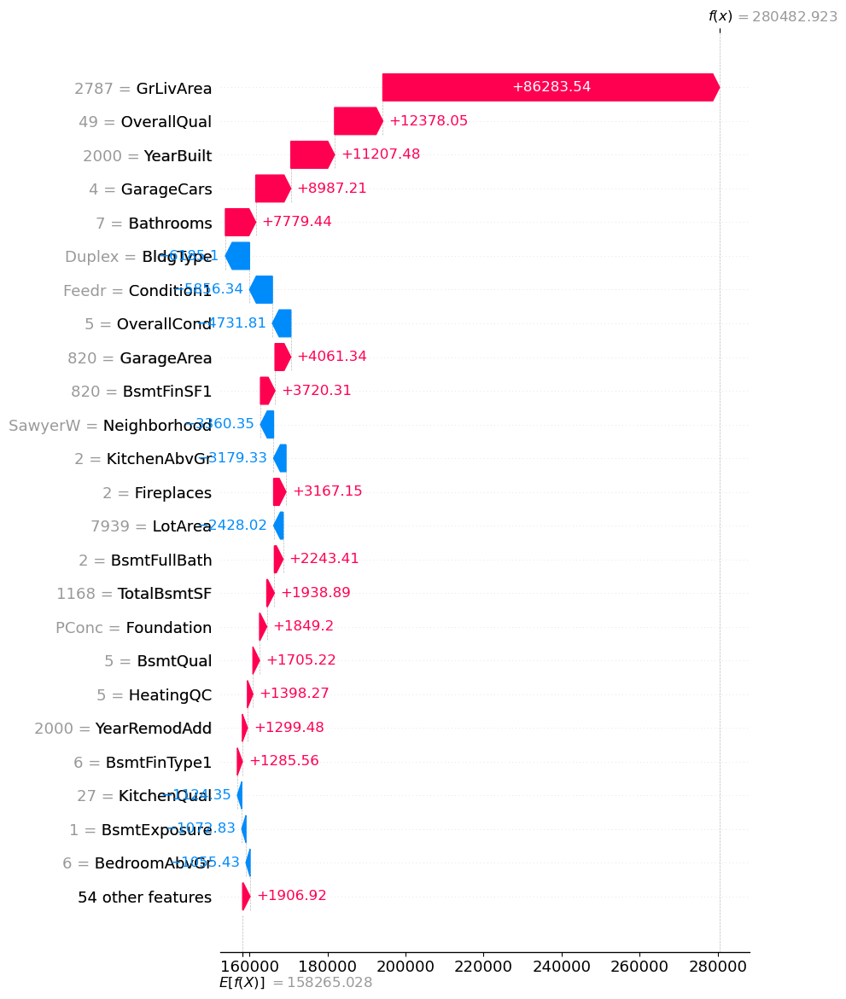

In [113]:
shap.waterfall_plot(exp_lasso[486], max_display=25)

# Fireplaces

In [124]:
trace1 = go.Scatter(
    x=X.Fireplaces,
    y=dollar_shap_df_xgb.Fireplaces,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.Fireplaces,
    y= dollar_shap_df_lasso.Fireplaces,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Fireplaces SHAP Values',
    xaxis=dict(title='Fireplaces'),
    yaxis=dict(title='SHAP Values ($)'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.show()

In [123]:
trace1 = go.Scatter(
    x=X.Fireplaces,
    y=shap_values_df_xgb_log.Fireplaces,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.Fireplaces,
    y= shap_values_df_lasso_log.Fireplaces,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Fireplaces SHAP Values',
    xaxis=dict(title='Fireplaces'),
    yaxis=dict(title='SHAP Values (log scale)'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.show()

# Screen porch

In [121]:
trace1 = go.Scatter(
    x=X.ScreenPorch,
    y=dollar_shap_df_xgb.ScreenPorch,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.ScreenPorch,
    y= dollar_shap_df_lasso.ScreenPorch,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Screen Porch SHAP Values',
    xaxis=dict(title='Screen Porch (square feet)'),
    yaxis=dict(title='SHAP Values ($)'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.show()

# Exterior

In [118]:
trace1 = go.Scatter(
    x=X.Exterior1st,
    y=dollar_shap_df_xgb.Exterior1st,
    mode='markers',
    name='XGB'
)
trace2 = go.Scatter(
    x= X.Exterior1st,
    y= dollar_shap_df_lasso.Exterior1st,
    mode='markers',
    name='Lasso'
)

# Create the layout
layout = go.Layout(
    title='Exterior SHAP Values',
    xaxis=dict(title='Exterior'),
    yaxis=dict(title='SHAP Values'),
)

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig.show()